# More pragmatic vs. literal learner plots, this time including entropy

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from make_df import make_df_from_spreadsheet
from rectangle_model import *
from scipy.stats import entropy

sns.set_style('white')
sns.set_context('talk')

In [2]:
filename = 'teaching_stimuli - all_examples.csv'
all_problems = make_df_from_spreadsheet(filename)

In [3]:
# Start with an example
problem_34 = {}
problem_34[0] = find_teacher_probs(0, 34, all_problems)  # 0 iterations
problem_34[500] = find_teacher_probs(500, 34, all_problems)

In [4]:
# def find_entropy(problem, exs, problem_index):
exs = [(25), (19, 25), (8, 19, 25)]
p_h_0 = [problem_34[0][1]['h'].loc[exs[0]], 
        problem_34[0][2]['h'].loc[exs[1]], 
        problem_34[0][3]['h'].loc[exs[2]]]

p_h_500 = [problem_34[500][1]['h'].loc[exs[0]], 
        problem_34[500][2]['h'].loc[exs[1]], 
        problem_34[500][3]['h'].loc[exs[2]]]

s_0 = [entropy(p_h_0[i].to_numpy()) for i in range(len(p_h_0))]

s_500 = [entropy(p_h_500[i].to_numpy()) for i in range(len(p_h_500))]

In [5]:
p_h_0[1].to_numpy()

array([0.33333333, 0.        , 0.33333333, 0.33333333])

In [6]:
print(s_0)

[1.0986122886681096, 1.0986122886681096, 0.0]


In [7]:
print(s_500)

[1.0892002396082978, 0.9822908136331638, 0.0]


In [8]:
def plot_pragmatic_literal_successive_probs_with_entropy(problem, exs, problem_index):
    
    # Probabilities over h_1
    p_h1_0 = [problem[0][1]['h'].loc[exs[0], 'h_1'], 
            problem[0][2]['h'].loc[exs[1], 'h_1'], 
            problem[0][3]['h'].loc[exs[2], 'h_1']]

    p_h1_500 = [problem[500][1]['h'].loc[exs[0], 'h_1'], 
            problem[500][2]['h'].loc[exs[1], 'h_1'], 
            problem[500][3]['h'].loc[exs[2], 'h_1']]

    n_ex = range(1,4)
    
    # Probabilities over all hypotheses
    p_h_0 = [problem[0][1]['h'].loc[exs[0]], 
        problem[0][2]['h'].loc[exs[1]], 
        problem[0][3]['h'].loc[exs[2]]]

    p_h_500 = [problem[500][1]['h'].loc[exs[0]], 
            problem[500][2]['h'].loc[exs[1]], 
            problem[500][3]['h'].loc[exs[2]]]
    
    # Calculate entropy
    s_0 = [entropy(p_h_0[i].to_numpy()) for i in range(len(p_h_0))]
    s_500 = [entropy(p_h_500[i].to_numpy()) for i in range(len(p_h_500))]
    
    # Calculate correlation
    r = np.corrcoef(p_h1_0, p_h1_500)
    # print(r)
    
    plt.figure(figsize=(8,6))
    
    plt.plot(n_ex, p_h1_0, 'b--', label='Literal')
    plt.plot(n_ex, p_h1_500, 'b', label='Pragmatic')

    plt.title(f'Problem {problem_index}, learner\'s belief in $h_1$, $r={r[0, 1]:.3}$')
    plt.xlabel('Examples')
    plt.ylabel('$P(h_1|d)$')
    plt.xticks(n_ex, exs)
    plt.ylim((-0.05, 1.05))
    plt.tick_params(axis='y', labelcolor='b')
    plt.legend(loc='lower left', title='$P(h_1|d)$')
    
    plt.twinx()
    
    plt.plot(n_ex, s_0, 'g--', label='Literal')
    plt.plot(n_ex, s_500, 'g', label='Pragmatic')
    plt.ylabel('Entropy')
    plt.tick_params(axis='y', labelcolor='g')
    plt.legend(loc='upper left', title='Entropy')
    
    #plt.tight_layout()
    plt.show()

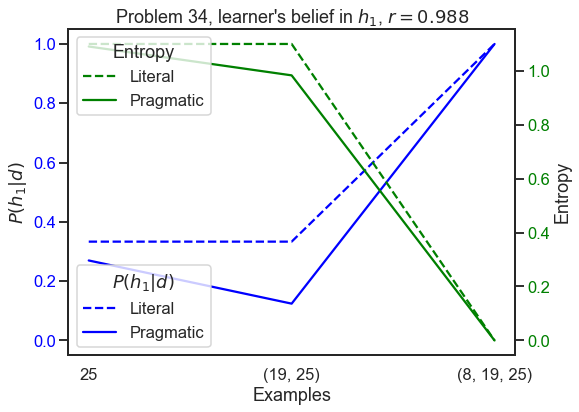

In [9]:
plot_pragmatic_literal_successive_probs_with_entropy(problem_34, exs, 34)

In [10]:
def plot_pragmatic_literal_succesive_probs(problem, exs, problem_index):

    plt.figure()

    p_h_0 = [problem[0][1]['h'].loc[exs[0], 'h_1'], 
            problem[0][2]['h'].loc[exs[1], 'h_1'], 
            problem[0][3]['h'].loc[exs[2], 'h_1']]

    p_h_500 = [problem[500][1]['h'].loc[exs[0], 'h_1'], 
            problem[500][2]['h'].loc[exs[1], 'h_1'], 
            problem[500][3]['h'].loc[exs[2], 'h_1']]

    n_ex = range(1,4)
    
    plt.plot(n_ex, p_h_0, label='Literal')
    plt.plot(n_ex, p_h_500, label='Pragmatic')

    plt.title(f'Problem {problem_index}, learner\'s belief in $h_1$')
    plt.xlabel('Examples')
    plt.ylabel('$P(h_1|d)$')
    plt.xticks(n_ex, exs)
    plt.ylim((-0.05, 1.05))
    plt.legend()

    plt.show()

In [11]:
def make_many_plots(all_problems, problem_index):
    
    # Plot a few high probability examples
    problem = {}
    problem[0] = find_teacher_probs(0, problem_index, all_problems)  # 0 iterations
    problem[500] = find_teacher_probs(500, problem_index, all_problems)
    
    plot_high_prob_examples(problem, 500, 'd', problem_index, all_problems)
    
    # Plot heatmap
    iters = [0, 500]
    k_values = [1, 2, 3]
    types = {'d': '$P(d|h)$', 'h': '$P(h|d)$'}

    for k in k_values:
        for i in iters:
            for t, v in types.items(): 
                _ = make_and_plot_prob_heatmap(problem[i][k][t], f'{i} iterations, k={k}, {v}')
    
    # Find a few high quality examples and plot
    
    ex_seqs = []
    exs = sort_values_ascending_by_column(problem[500][3]['h'], 'h_1').head(5).index  # randomize later?
    
    for ex in exs: 
        ex_seqs.append([(ex[0]), (ex[0], ex[1]), (ex[0], ex[1], ex[2])])
        ex_seqs.append([(ex[0]), (ex[0], ex[2]), (ex[0], ex[1], ex[2])])
        ex_seqs.append([(ex[1]), (ex[0], ex[1]), (ex[0], ex[1], ex[2])])
        ex_seqs.append([(ex[1]), (ex[1], ex[2]), (ex[0], ex[1], ex[2])])
        ex_seqs.append([(ex[2]), (ex[1], ex[2]), (ex[0], ex[1], ex[2])])
        ex_seqs.append([(ex[2]), (ex[0], ex[2]), (ex[0], ex[1], ex[2])])
        
    # Plot pragmatic vs. literal listener plots with entropy
    for i in range(len(ex_seqs)):
        plot_pragmatic_literal_successive_probs_with_entropy(problem, ex_seqs[i], problem_index)

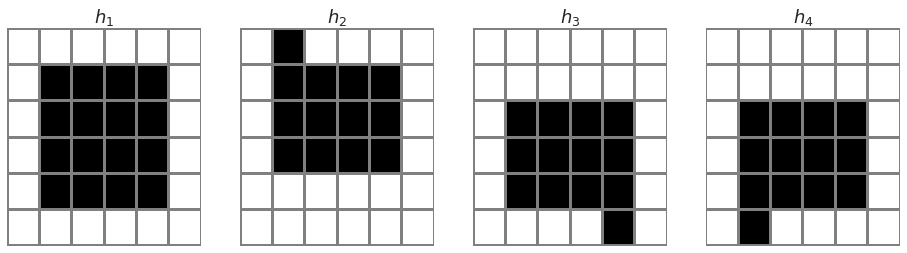

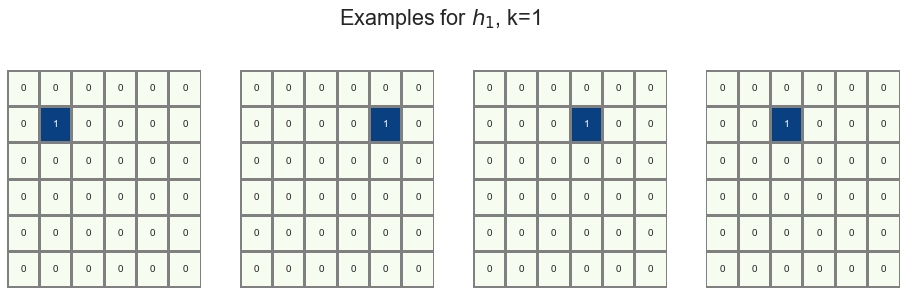

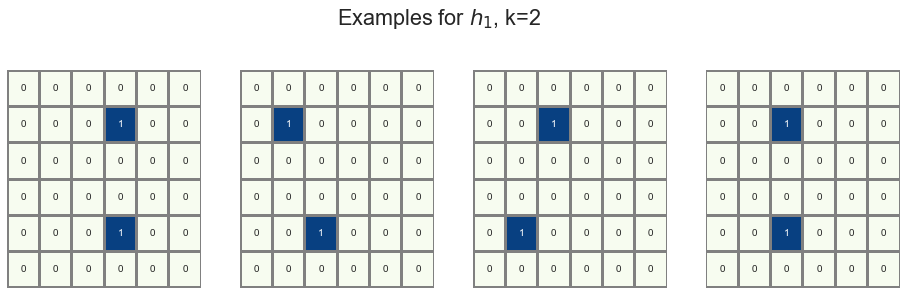

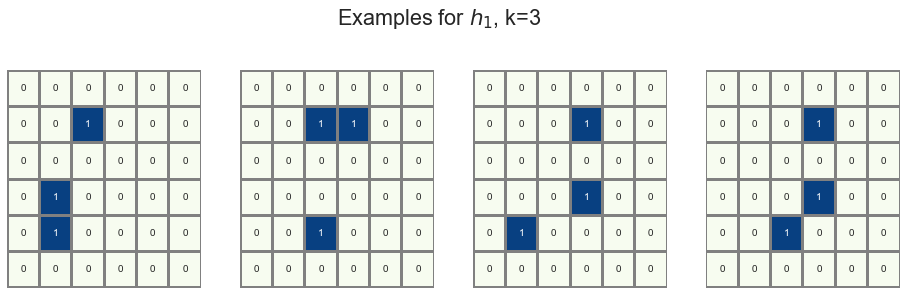

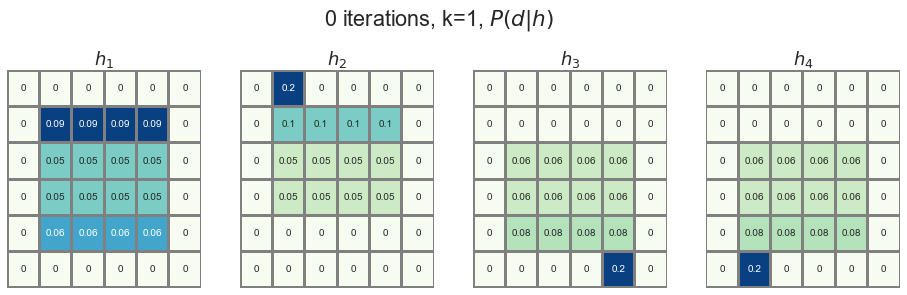

...

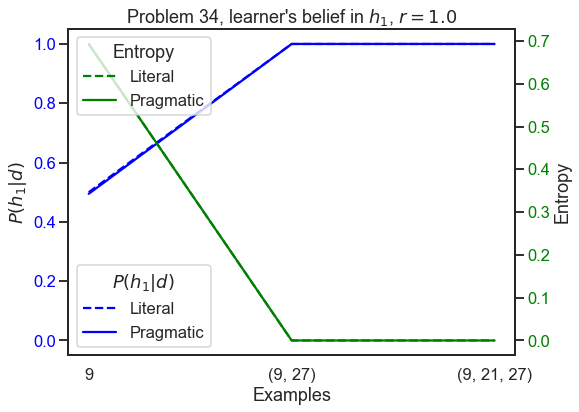

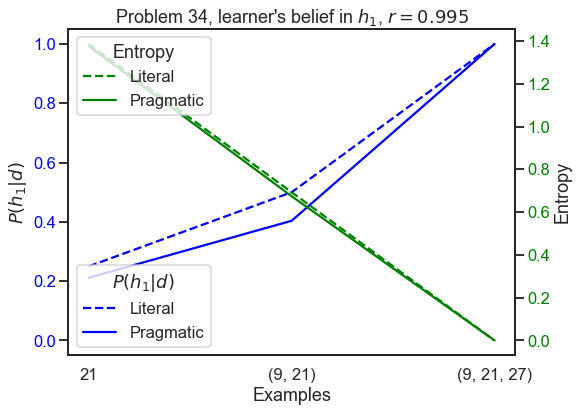

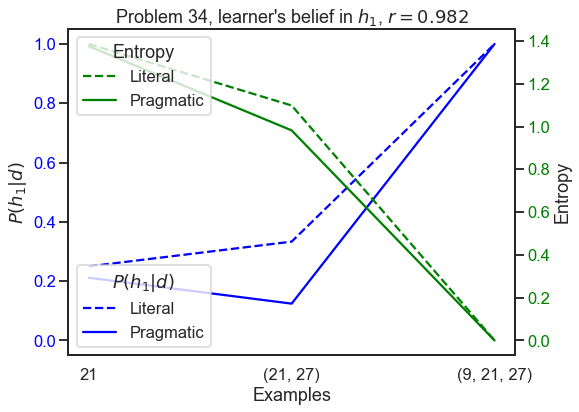

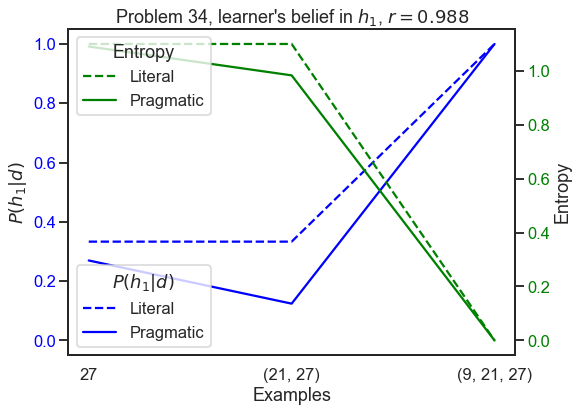

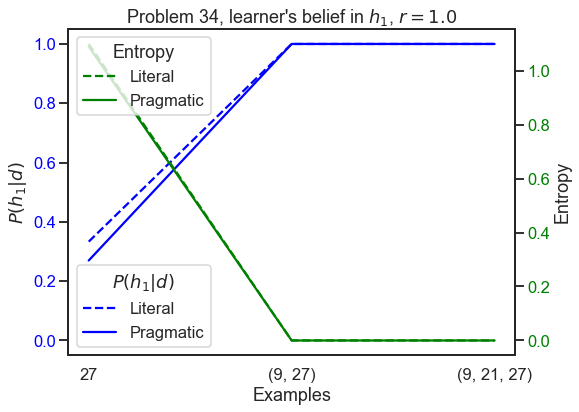

In [12]:
make_many_plots(all_problems, 34)

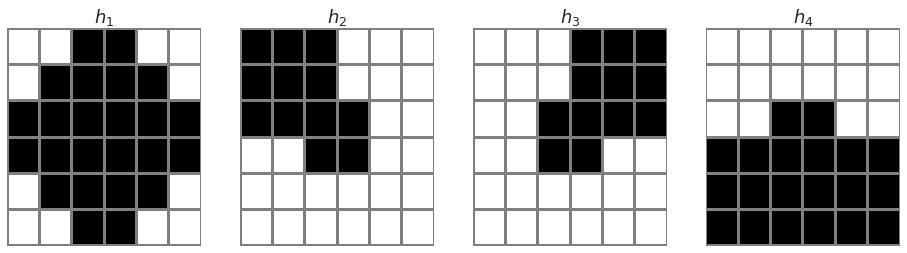

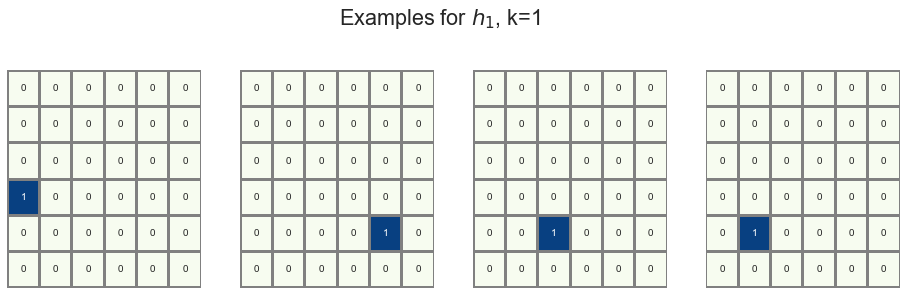

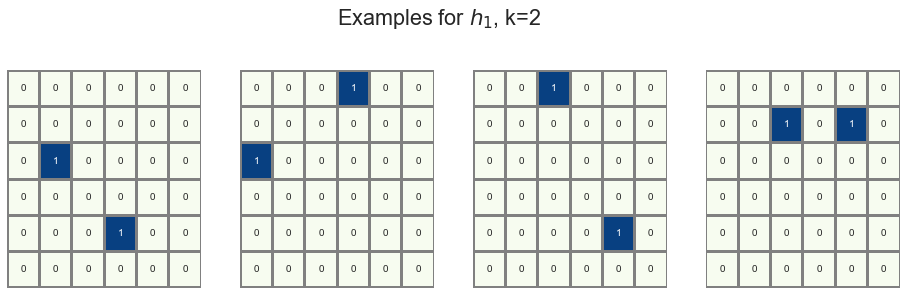

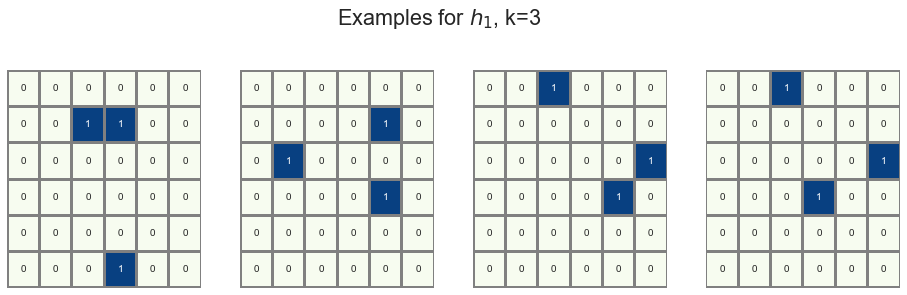

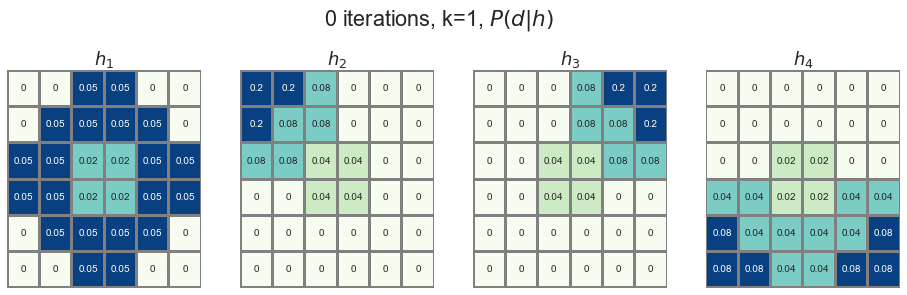

...

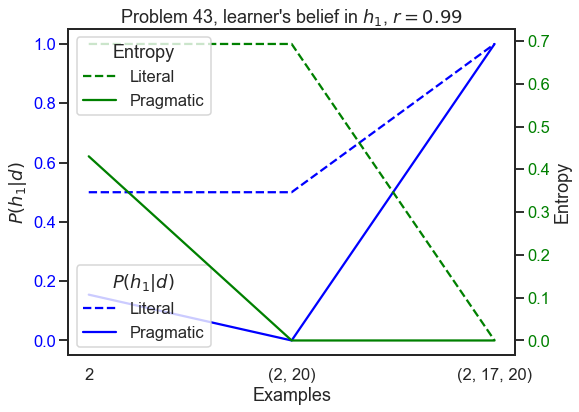

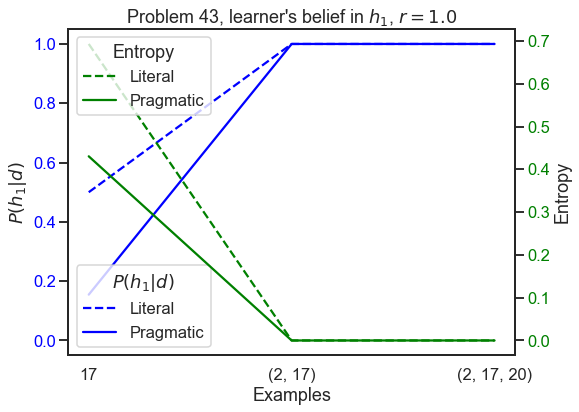

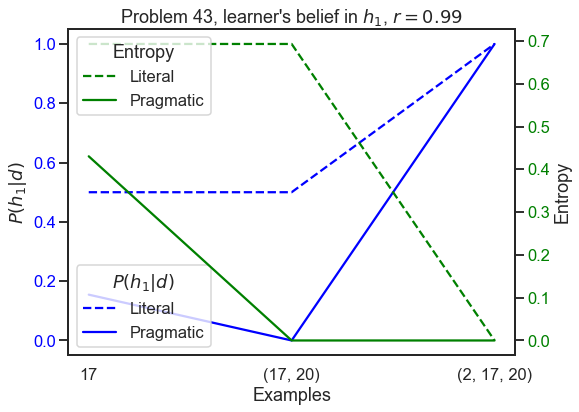

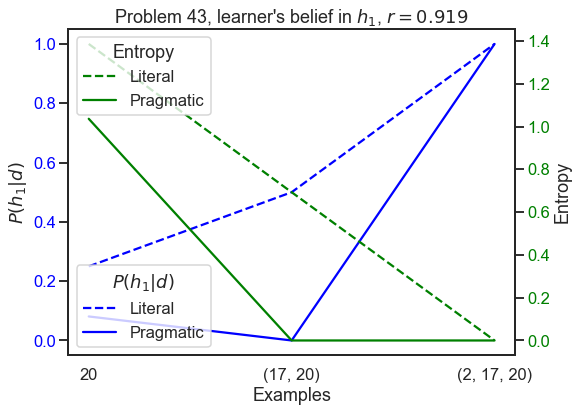

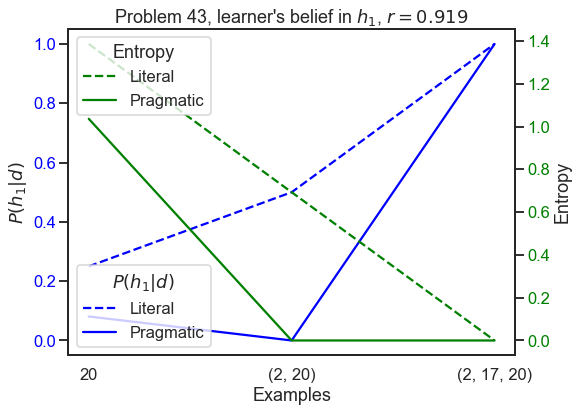

In [13]:
make_many_plots(all_problems, 43)

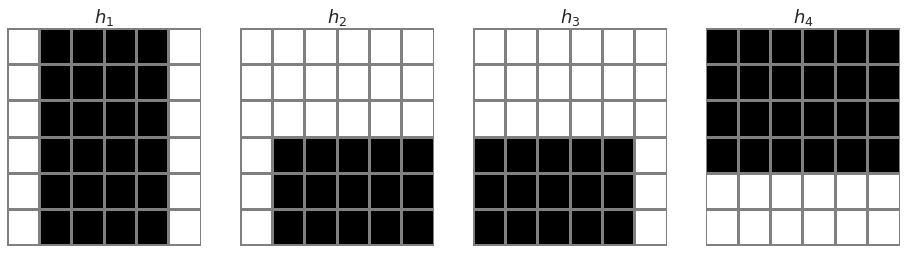

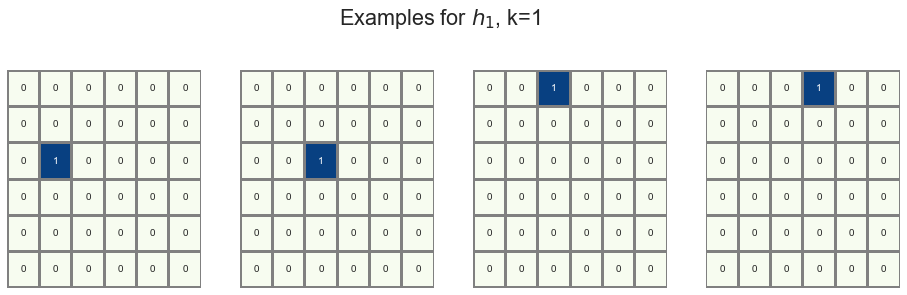

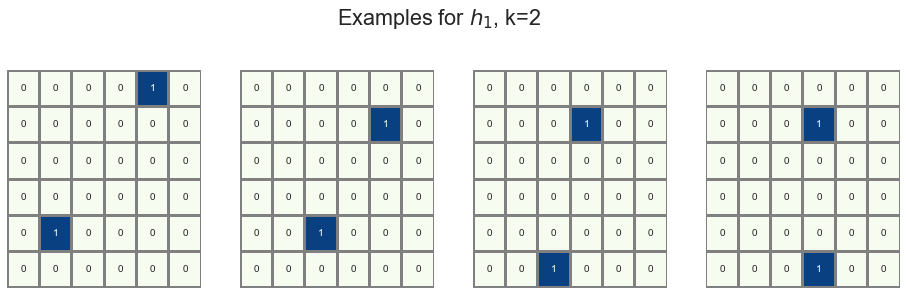

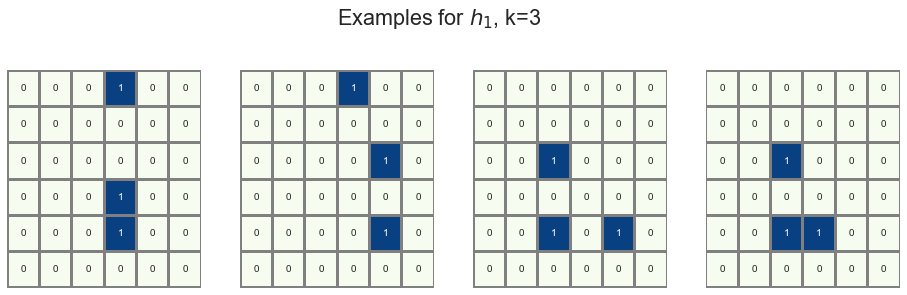

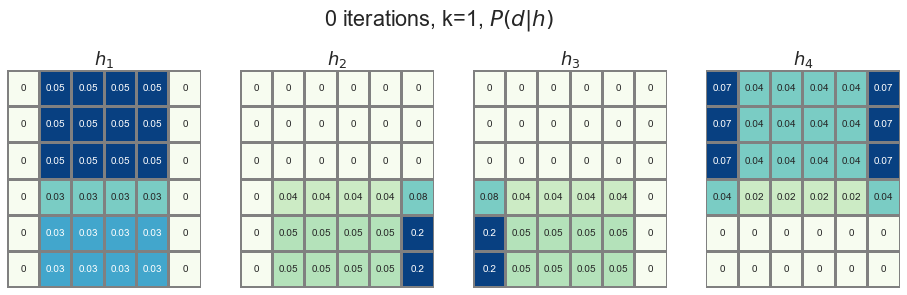

...

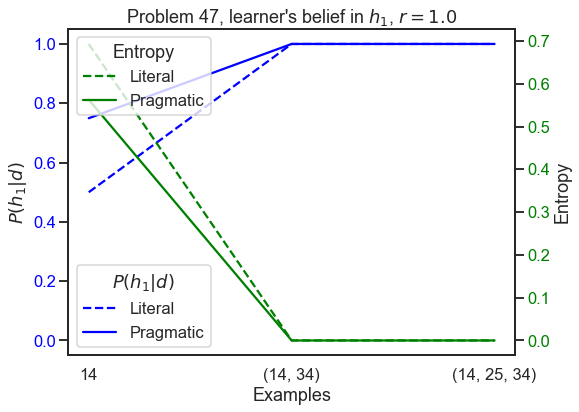

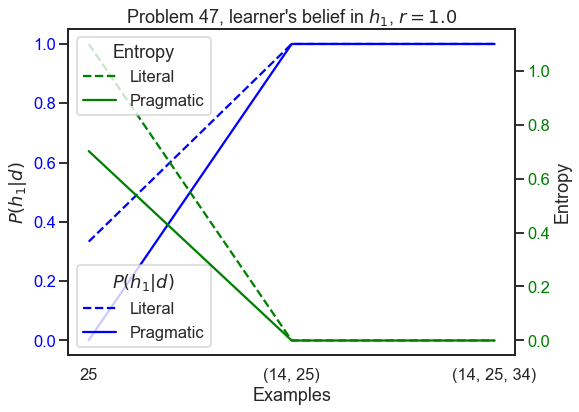

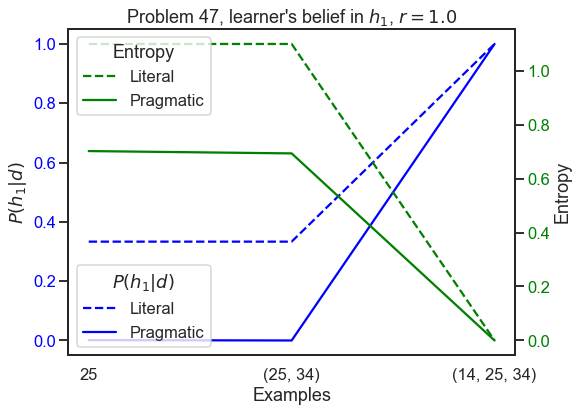

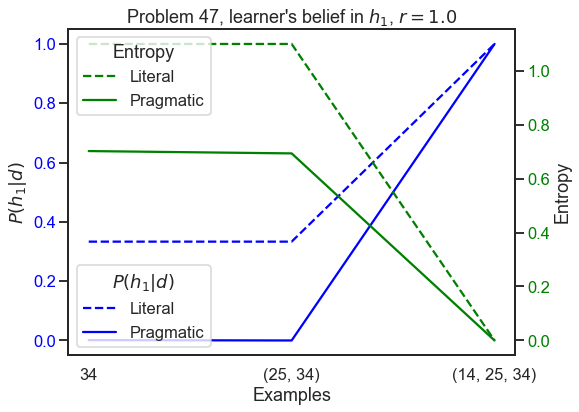

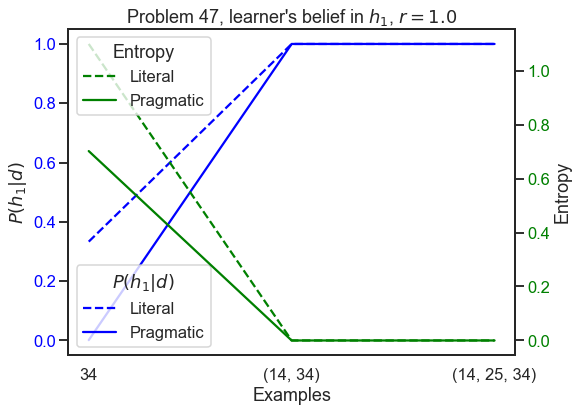

In [14]:
make_many_plots(all_problems, 47)

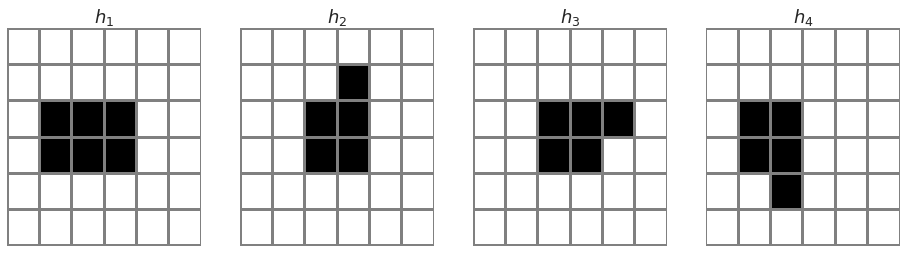

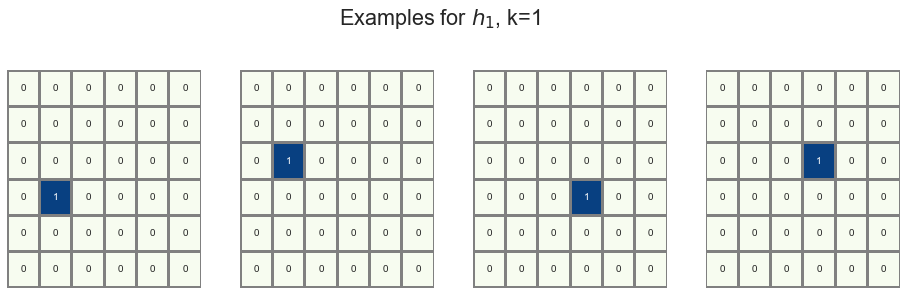

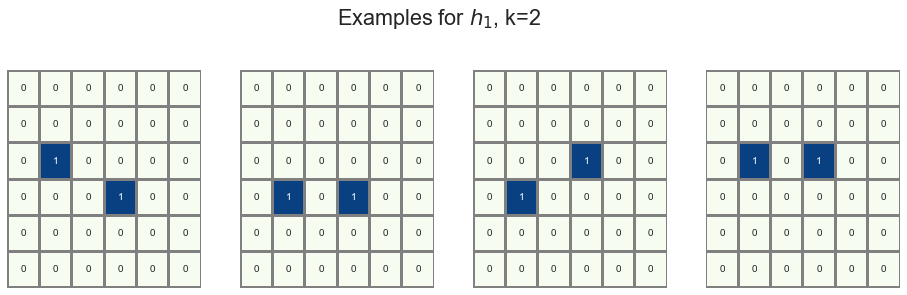

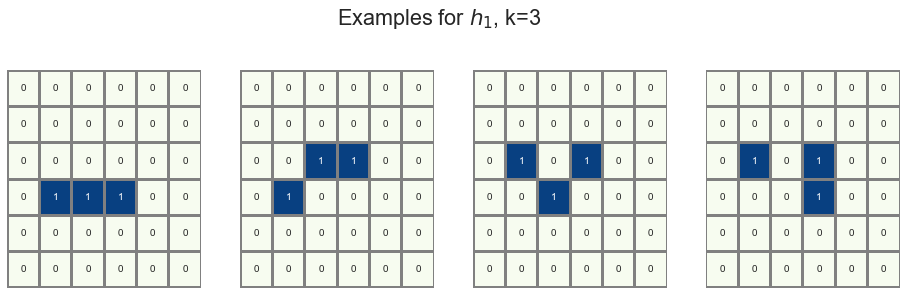

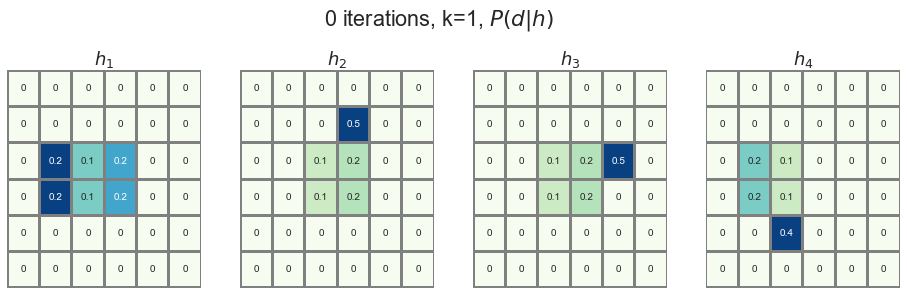

...

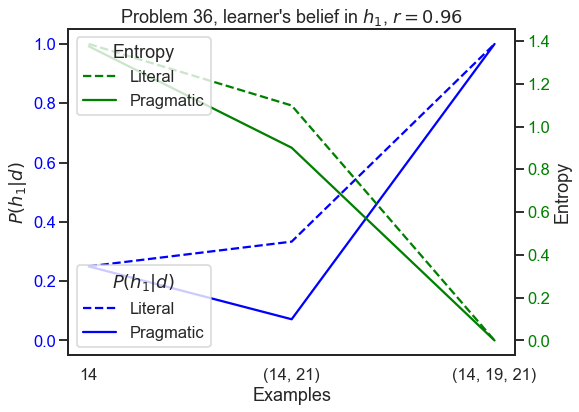

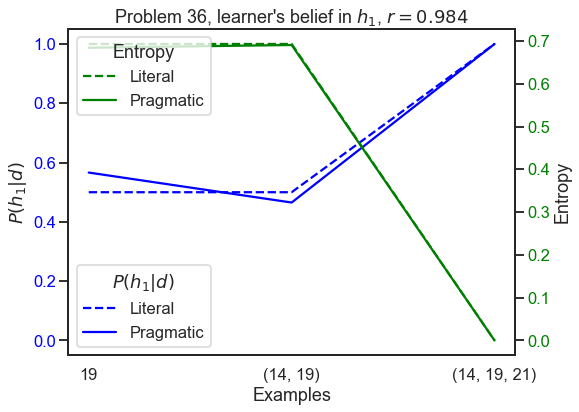

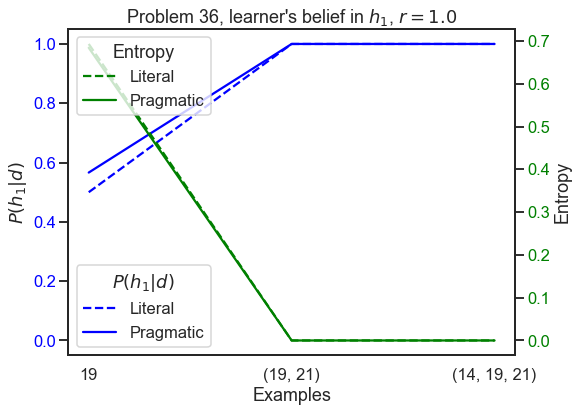

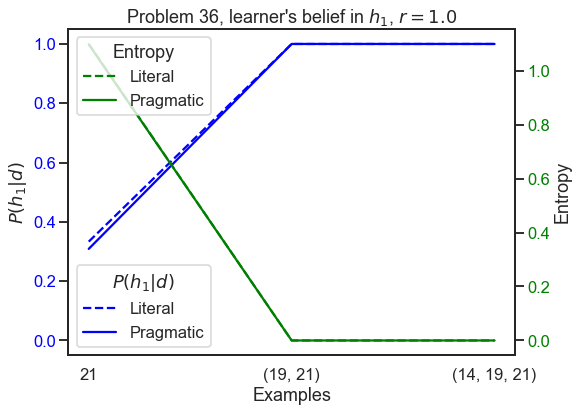

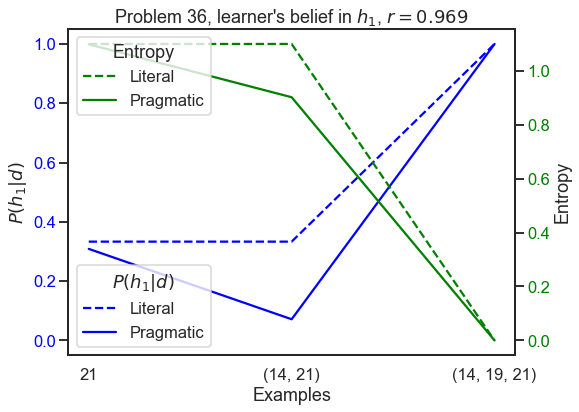

In [15]:
make_many_plots(all_problems, 36)

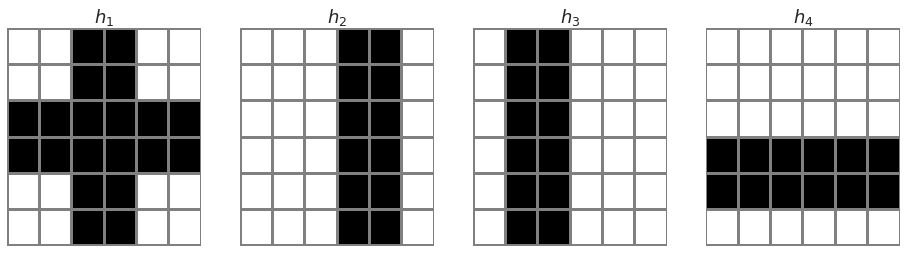

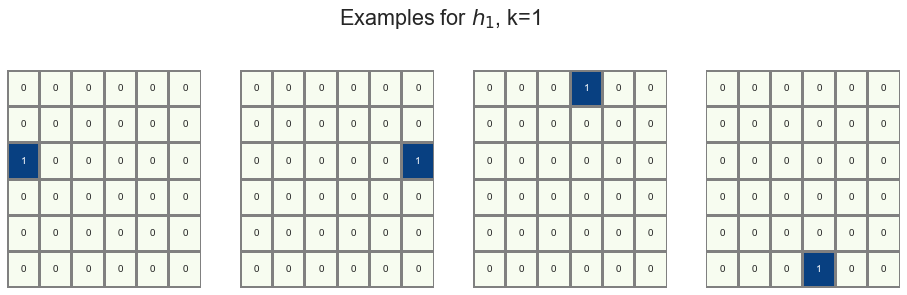

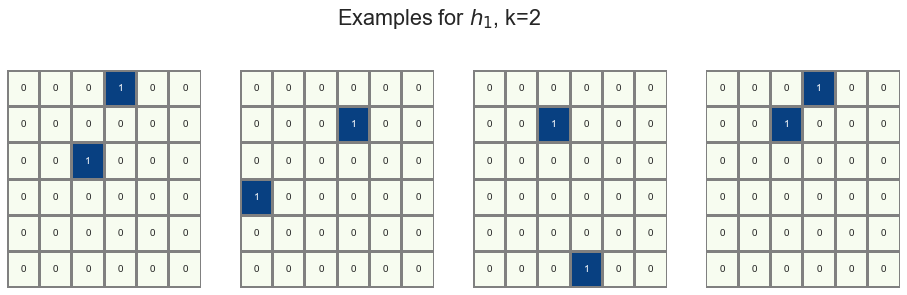

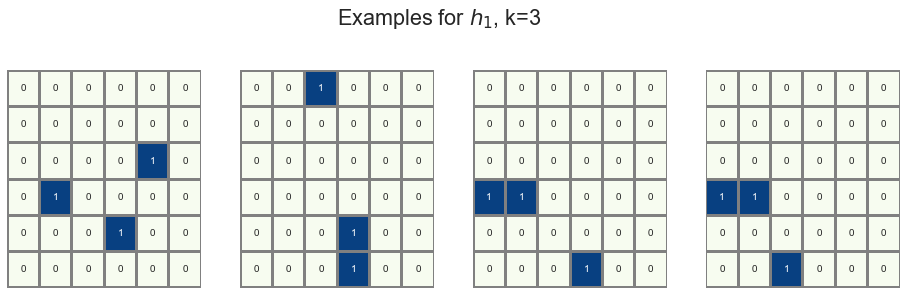

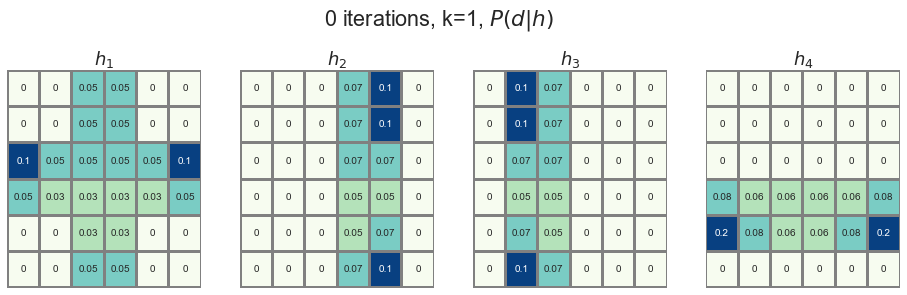

...

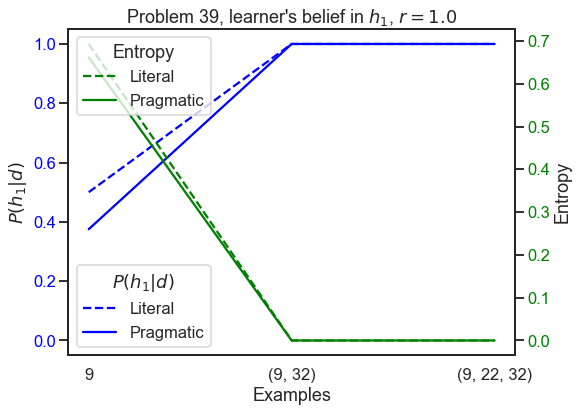

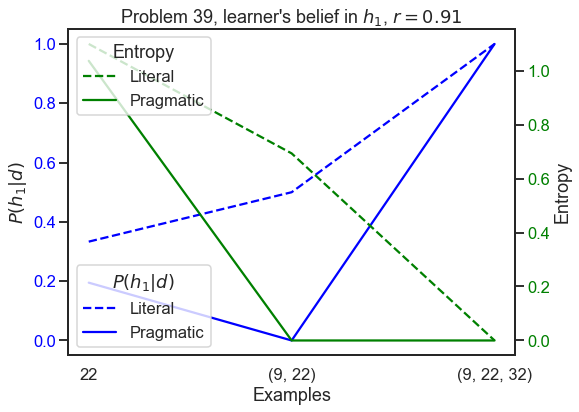

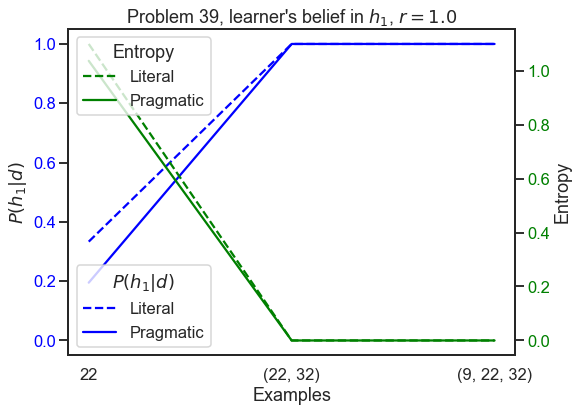

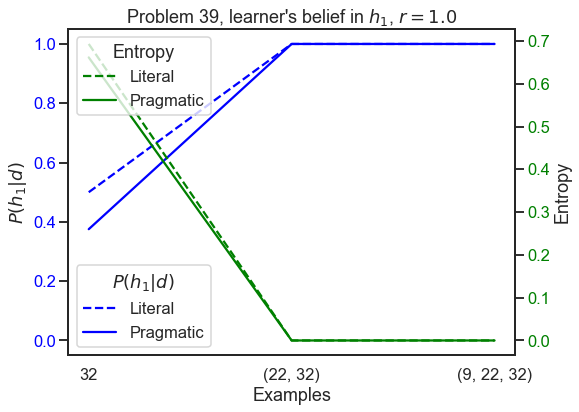

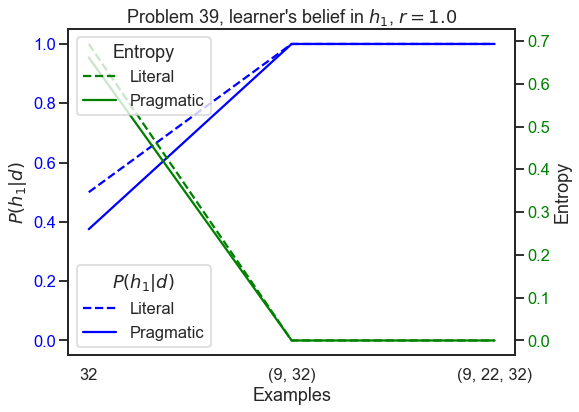

In [16]:
make_many_plots(all_problems, 39)

/opt/anaconda3/lib/python3.7/site-packages/numpy/lib/function_base.py:2559: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/opt/anaconda3/lib/python3.7/site-packages/numpy/lib/function_base.py:2560: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


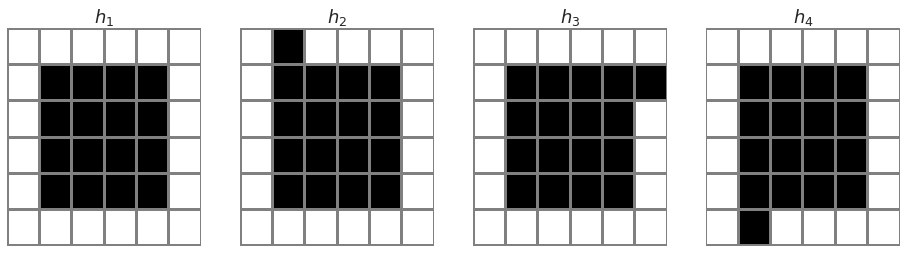

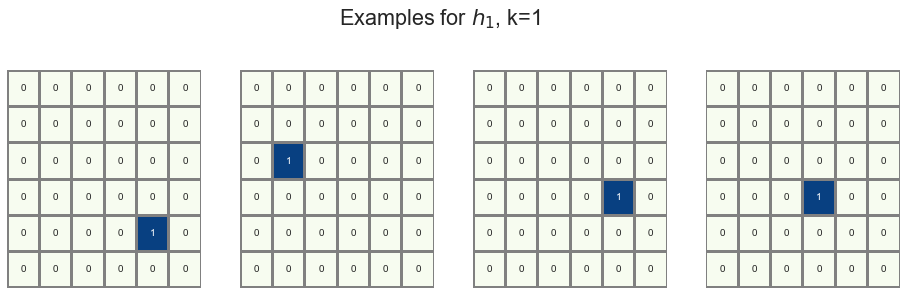

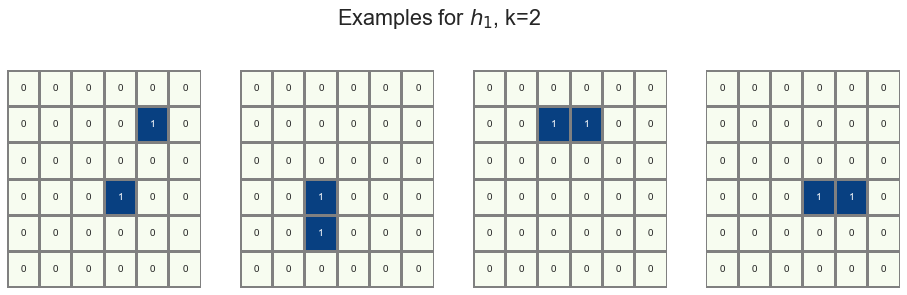

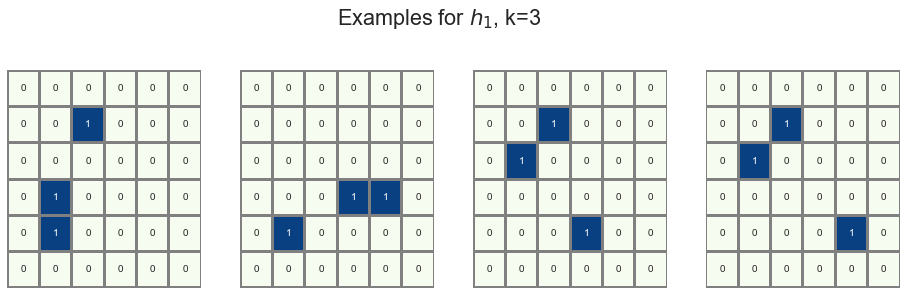

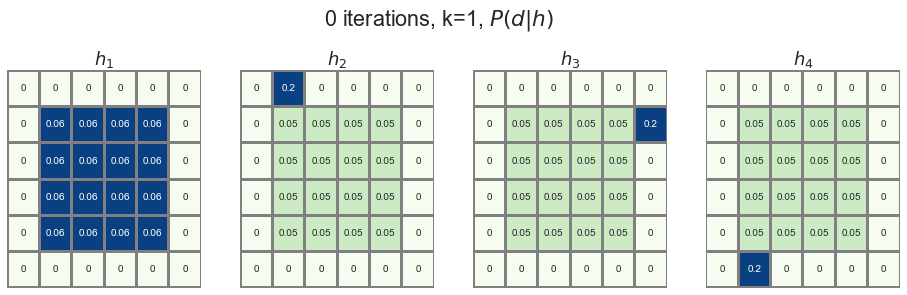

...

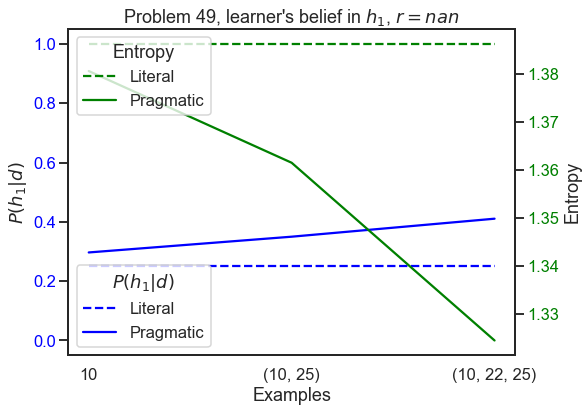

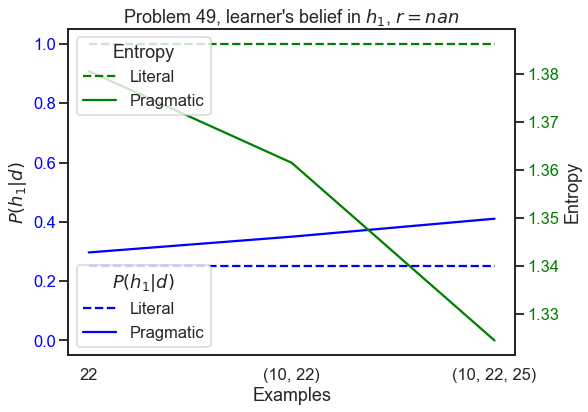

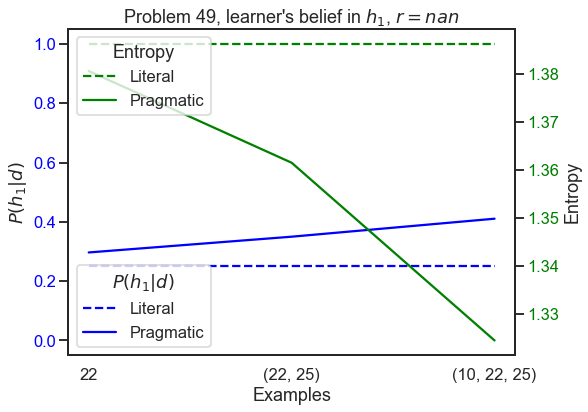

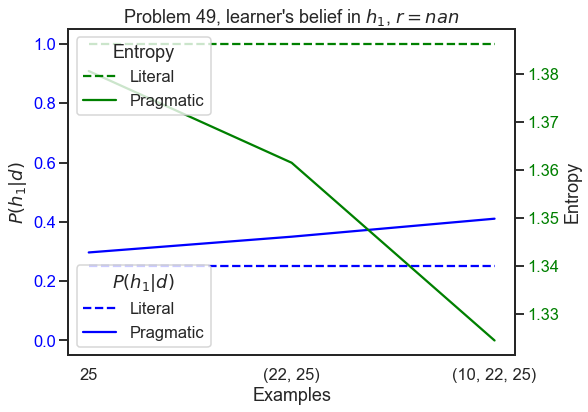

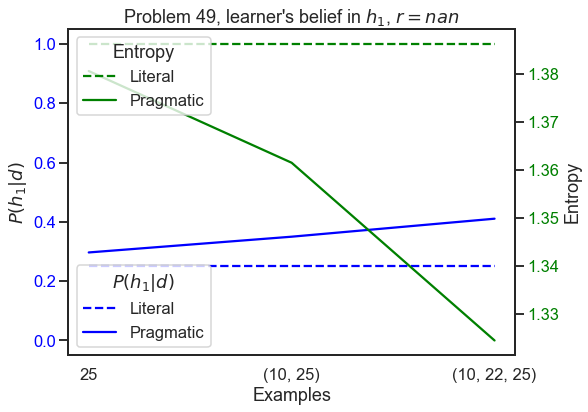

In [17]:
make_many_plots(all_problems, 49)

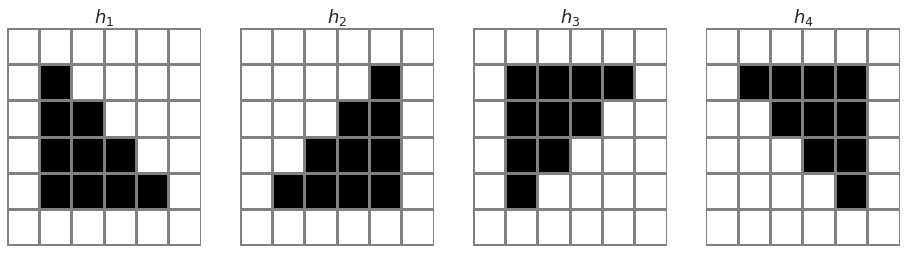

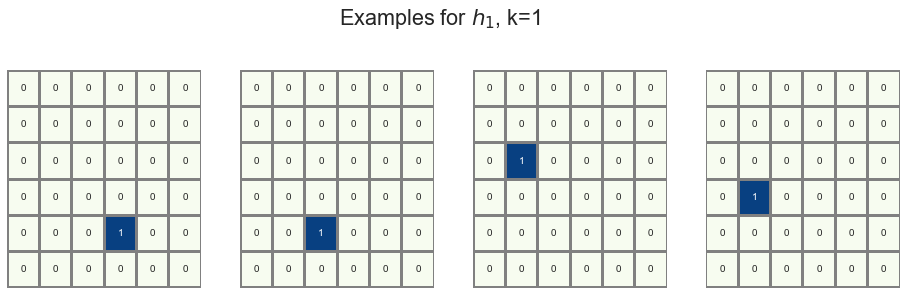

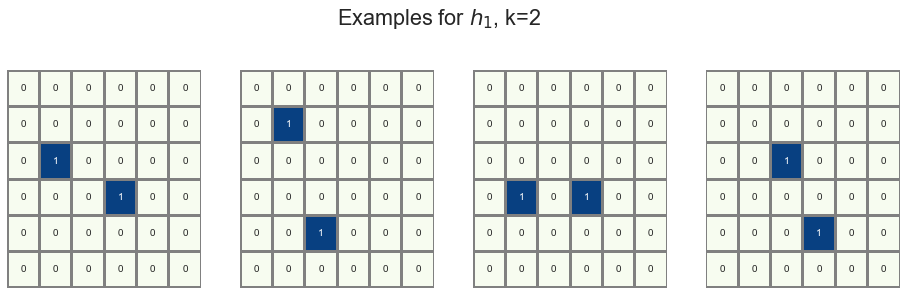

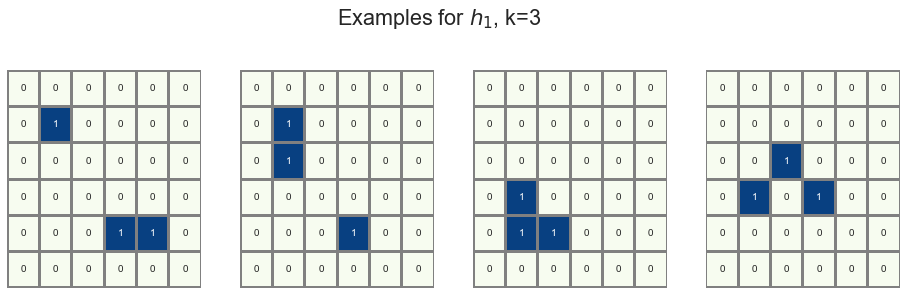

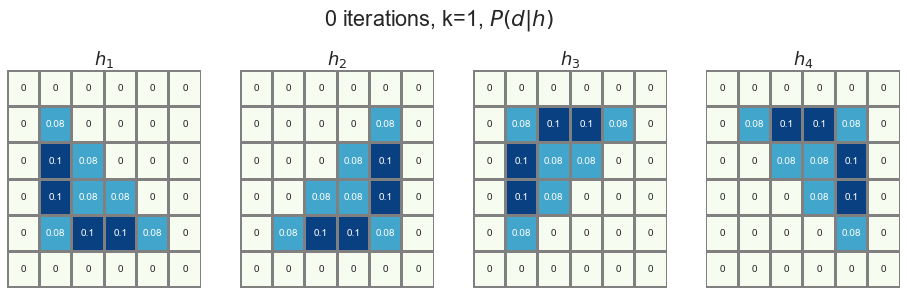

...

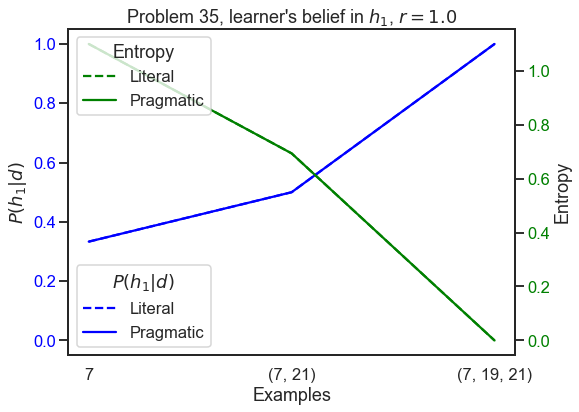

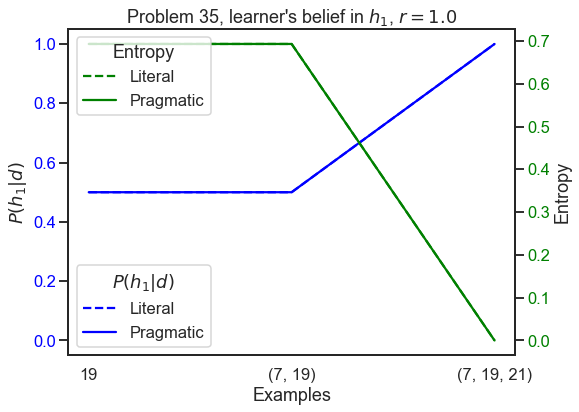

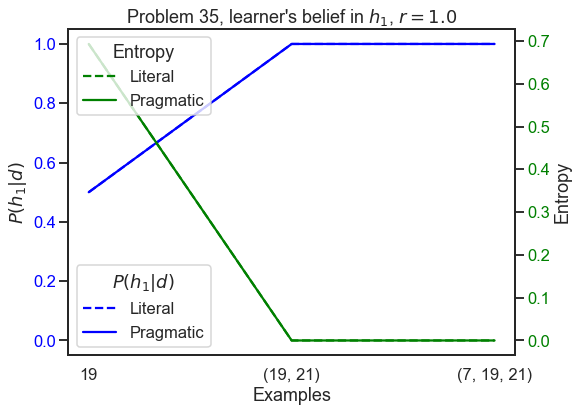

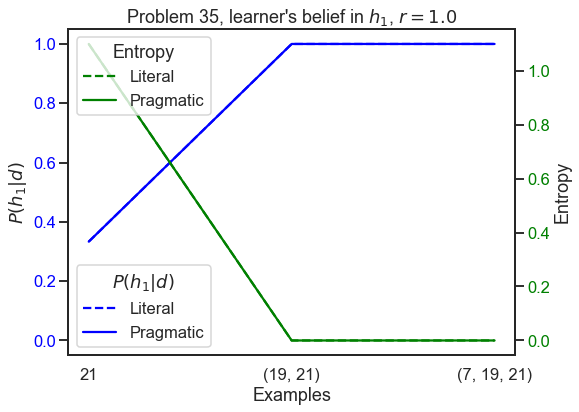

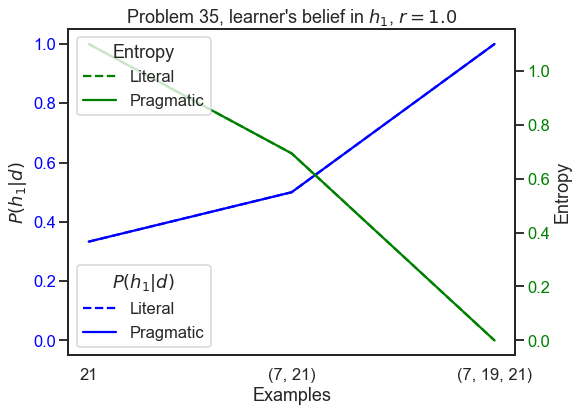

In [18]:
make_many_plots(all_problems, 35)